Notes:


Aug, 2021

- Project lead by [Sergei V. Kalinin](https://scholar.google.com/citations?hl=en&user=-cuxoSQAAAAJ&view_op=list_works&sortby=pubdate)
- DKL developed by [Maxim Ziatdinov](https://scholar.google.com/citations?user=YnSdOoUAAAAJ&hl=en)
- BEPFM and BEPS data acquired by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- Analyses of BE- data by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- DKL-BEPS deployed by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- PTO sample from [Hiroshi Funakubo](https://scholar.google.co.jp/citations?user=12EJj9gAAAAJ&hl=ja)

Package Version:


*   atomai: 0.7.2
*   numpy: 1.19.5
*   matplotlib: 3.2.2
*   h5py: 3.1.0
*   pyUSID: 0.0.10
*   torch: 1.8.1+cu102
*   gpytorch: 1.5.0
*   botorch: 0.5.0
*   scipy: 1.4.1
*   sklearn: 0.22.2.post1

# Install and Import:

In [1]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1;
!pip install gpytorch botorch;
!pip install gpytorch botorch;
!pip install atomai;
!pip install pycroscopy;

     |████████████████████████████████| 804.1 MB 2.4 kB/s 
     |████████████████████████████████| 17.4 MB 199 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.8.1 which is incompatible.
     |████████████████████████████████| 498 kB 8.5 MB/s 
     |████████████████████████████████| 475 kB 37.3 MB/s 
     |████████████████████████████████| 143 kB 8.0 MB/s 
     |████████████████████████████████| 193 kB 71.5 MB/s 
     |█████████████████████████

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import pyUSID as usid

import torch
import gpytorch
import botorch

from atomai import utils
from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split

## Define DKL-GPR class

In [3]:
#@title Define the deep kernel learning (DKL)-based Gaussian process regression (GPR):
from typing import Tuple, Type, Optional, Union
import warnings

class dklGPR:
    """
    Deep kernel learning (DKL)-based Gaussian process regression (GPR)
    Based on https://arxiv.org/abs/1511.02222.

    Args:
        indim: input feature dimension
        embedim: embedding dimension (determines dimensionality of kernel space)
        
    Keyword Args:
        device:
            Sets a device to which the model and data will be moved.
            Defaults to 'cuda:0' if a GPU is available and to CPU otherwise.
        precision:
            Sets tensor types for 'single' (torch.float32)
            or 'double' (torch.float64) precision
        seed:
            Seed for enforcing reproducibility
    """
    def __init__(self,
                 indim: int,
                 embedim: int = 2,
                 **kwargs: Union[str, int]) -> None:
        """
        Initializes DKL-GPR.
        """
        set_seed_and_precision(**kwargs)
        self.dimdict = {"input_dim": indim, "embedim": embedim}
        self.device = kwargs.get(
            "device", 'cuda:0' if torch.cuda.is_available() else 'cpu')
        precision = kwargs.get("precision", "double")
        self.dtype = torch.float32 if precision == "single" else torch.float64
        self.gp_model = None
        self.likelihood = None
        self.compiled = False
        self.train_loss = []

    def _set_data(self, x: Union[torch.Tensor, np.ndarray],
                  device: str=None) -> torch.tensor:
        """Data preprocessing."""
        device_ = device if device else self.device
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x).to(self.dtype).to(device_)
        elif isinstance(x, torch.Tensor):
            x = x.to(self.dtype).to(device_)
        else:
            raise TypeError("Pass data as ndarray or torch tensor object")
        return x

    def set_data(self, x: Union[torch.Tensor, np.ndarray],
                 y: Optional[Union[torch.Tensor, np.ndarray]] = None,
                 device: str=None) -> Tuple[torch.tensor]:
        """Data preprocessing. Casts data arrays to a selected tensor type
        and moves it to a selected devive."""
        x = self._set_data(x, device)
        if y is not None:
            y = y[None] if y.ndim == 1 else y
            y = self._set_data(y, device)
        return x, y

    def compile_trainer(self, X: Union[torch.Tensor, np.ndarray],
                        y: Union[torch.Tensor, np.ndarray],
                        training_cycles: int,
                        **kwargs: Union[Type[torch.nn.Module], bool, float]
                        ) -> None:
        """
        Initializes deep kernel (feature extractor NN + base kernel),
        sets optimizer and "loss" function.

        Args:
            X: Input training data (aka features) of N x input_dim dimensions
            y: Output targets of batch_size x N or N (if batch_size=1) dimensions
            training_cycles: Number of training epochs

        Keyword Args:
            feature_extractor:
                (Optional) Custom neural network for feature extractor
            freeze_weights:
                Freezes weights of feature extractor, that is, they are not
                passed to the optimizer. Used for a transfer learning.
            lr: learning rate (Default: 0.01)
        """
        X, y = self.set_data(X, y)
        input_dim, embedim = self.dimdict["input_dim"], self.dimdict["embedim"]
        feature_extractor = kwargs.get("feature_extractor")
        if feature_extractor is None:
            feature_extractor = fcFeatureExtractor(input_dim, embedim)
        likelihood = gpytorch.likelihoods.GaussianLikelihood()
        self.gp_model = GPRegressionModel(
            X, y, likelihood, feature_extractor, embedim)
        self.likelihood = likelihood
        self.gp_model.to(self.device)
        self.likelihood.to(self.device)
        self.gp_model.train()
        self.likelihood.train()
        list_of_params = [
            {'params': self.gp_model.covar_module.parameters()},
            {'params': self.gp_model.mean_module.parameters()},
            {'params': self.gp_model.likelihood.parameters()}]
        if not kwargs.get("freeze_weights", False):
            list_of_params.append(
                {'params': self.gp_model.feature_extractor.parameters()})
        self.optimizer = torch.optim.Adam(list_of_params, lr=kwargs.get("lr", 0.01))
        self.mll = gpytorch.mlls.ExactMarginalLogLikelihood(self.likelihood, self.gp_model)
        self.training_cycles = training_cycles
        self.compiled = True

    def fit(self, X: Union[torch.Tensor, np.ndarray],
            y: Union[torch.Tensor, np.ndarray],
            training_cycles: int = 50,
            **kwargs: Union[Type[torch.nn.Module], bool, float]
            ) -> None:
        """
        Initializes and trains a deep kernel GP model

        Args:
            X: Input training data (aka features) of N x input_dim dimensions
            y: Output targets of batch_size x N or N (if batch_size=1) dimensions
            training_cycles: Number of training epochs

        Keyword Args:
            feature_extractor:
                (Optional) Custom neural network for feature extractor
            freeze_weights:
                Freezes weights of feature extractor, that is, they are not
                passed to the optimizer. Used for a transfer learning.
            lr: learning rate (Default: 0.01)
            print_loss: print loss at every n-th training cycle (epoch)
        """
        X, y = self.set_data(X, y)
        if not self.compiled:
            self.compile_trainer(X, y, training_cycles, **kwargs)
        for e in range(self.training_cycles):
            self.optimizer.zero_grad()
            output = self.gp_model(X)
            loss = -self.mll(output, y).sum()
            loss.backward()
            self.optimizer.step()
            self.train_loss.append(loss.item())
            if any([e == 0, (e + 1) % kwargs.get("print_loss", 10) == 0,
                    e == self.training_cycles - 1]):
                self.print_statistics(e)

    def _compute_posterior(self, X: torch.Tensor) -> gpytorch.distributions.MultivariateNormal:
        """
        Computes the posterior over model outputs at the provided points (X).
        """
        self.gp_model.eval()
        self.likelihood.eval()
        wrn = gpytorch.models.exact_gp.GPInputWarning
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=wrn)
            with torch.no_grad(), gpytorch.settings.use_toeplitz(False), gpytorch.settings.fast_pred_var():
                posterior = self.gp_model(X.to(self.device))
        return posterior

    def sample_from_posterior(self, X, num_samples: int = 1000) -> np.ndarray:
        """
        Computes the posterior over model outputs at the provided points (X)
        and samples from it
        """
        X, _ = self.set_data(X)
        posterior = self._compute_posterior(X)
        samples = posterior.rsample(torch.Size([num_samples, ]))
        return samples.cpu().numpy()

    def _predict(self, x_new: torch.Tensor) -> Tuple[torch.Tensor]:
        y_pred = self._compute_posterior(x_new)
        return y_pred.mean.cpu(), y_pred.variance.cpu()

    def predict(self, x_new: Union[torch.Tensor, np.ndarray],
                **kwargs) -> Tuple[np.ndarray]:
        """
        Prediction of mean and variance using the trained model
        """
        gp_batch_dim = self.gp_model.train_targets.size(0)
        x_new, _ = self.set_data(x_new, device='cpu')
        data_loader = init_dataloader(x_new, shuffle=False, **kwargs)
        predicted_mean, predicted_var = [], []
        for (x,) in data_loader:
            x = x.expand(gp_batch_dim, *x.shape)
            mean, var = self._predict(x)
            predicted_mean.append(mean)
            predicted_var.append(var)
        return (torch.cat(predicted_mean, 1).numpy().squeeze(),
                torch.cat(predicted_var, 1).numpy().squeeze())
    
    def _embed(self, x_new: torch.Tensor):
        self.gp_model.feature_extractor.eval()
        with torch.no_grad():
            embeded = self.gp_model.feature_extractor(x_new)
        return embeded.cpu()
    
    def embed(self, x_new: Union[torch.Tensor, np.ndarray],
              **kwargs: int) -> torch.Tensor:
        """
        Embeds the input data to a "latent" space using a trained feature extractor NN.
        """
        x_new, _ = self.set_data(x_new, device='cpu')
        data_loader = init_dataloader(x_new, shuffle=False, **kwargs)
        embeded = torch.cat([self._embed(x.to(self.device)) for (x,) in data_loader], 0)
        return embeded.numpy()

    def print_statistics(self, e):
        print('Epoch {}/{} ...'.format(e+1, self.training_cycles),
              'Training loss: {}'.format(np.around(self.train_loss[-1], 4)))


class fcFeatureExtractor(torch.nn.Sequential):           
    def __init__(self, feat_dim, embedim, **kwargs):  
        """Initializes feature extractor module"""                                    
        super(fcFeatureExtractor, self).__init__()
        hidden_dim = kwargs.get("hidden_dim")
        if hidden_dim is None:
            hidden_dim = [1000, 500, 50]
        hidden_dim.append(embedim)
        self.add_module("linear1", torch.nn.Linear(feat_dim, hidden_dim[0]))
        for i, h in enumerate(hidden_dim[1:]):
            self.add_module('relu{}'.format(i+1), torch.nn.ReLU())
            self.add_module('linear{}'.format(i+2), torch.nn.Linear(hidden_dim[i], h))


class GPRegressionModel(gpytorch.models.ExactGP, botorch.models.gpytorch.GPyTorchModel):
    """DKL GPR module"""
    num_outputs = 1
    def __init__(self, X: torch.Tensor, y: torch.Tensor,
                 likelihood: Type[gpytorch.likelihoods.Likelihood],
                 feature_extractor: Type[torch.nn.Module], embedim: int) -> None:
        """
        Initializes DKL GP module
        """
        super(GPRegressionModel, self).__init__(X, y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        batch_dim = y.size(0)
        base_kernel = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(
                ard_num_dims=embedim, batch_shape=torch.Size([batch_dim])),
                batch_shape=torch.Size([batch_dim]))
        self.covar_module = gpytorch.kernels.GridInterpolationKernel(
            base_kernel, num_dims=embedim, grid_size=50)
        self.feature_extractor = feature_extractor
        self.scale_to_bounds = gpytorch.utils.grid.ScaleToBounds(-1., 1.)

    def forward(self, x: torch.Tensor) -> gpytorch.distributions.MultivariateNormal:
        """
        Forward pass
        """
        # Pass data through a neural network
        embedded_x = self.feature_extractor(x)
        embedded_x = self.scale_to_bounds(embedded_x)
        # Standard GP part
        mean_x = self.mean_module(embedded_x)
        covar_x = self.covar_module(embedded_x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)


def set_seed_and_precision(seed: int = 42, precision: str = "double"):
    """Sets the tensor type and seed"""
    if precision == 'single':
        tensor_type = torch.FloatTensor
        tensor_type_gpu = torch.cuda.FloatTensor
    else:
        tensor_type = torch.DoubleTensor
        tensor_type_gpu = torch.cuda.DoubleTensor
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        torch.set_default_tensor_type(tensor_type_gpu)
    else:
        torch.set_default_tensor_type(tensor_type)

def init_dataloader(X: Union[torch.tensor, Tuple[torch.tensor]],
                    shuffle: bool = True, **kwargs: int) -> Type[torch.utils.data.DataLoader]:
    """Returns the initialized PyTorch dataloader."""
    batch_size = kwargs.get("batch_size", 500)
    X = (X,) if isinstance(X, torch.Tensor) else X
    tensor_set = torch.utils.data.dataset.TensorDataset(*X)
    data_loader = torch.utils.data.DataLoader(
        dataset=tensor_set, batch_size=batch_size, shuffle=shuffle)
    return data_loader

## Defne acquisition functions

In [4]:
#@title Define acquisition functions for BO:
from typing import Union

def EI(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()


def qUCB(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()

In [5]:
#@title Help function for loop area
import numpy as np
from scipy.signal import find_peaks
import h5py

def pix_to_xy(pixind, num_cols):
    col = int(pixind % (num_cols))
    row =int(np.floor(pixind/ num_cols))
    return row, col

def xy_to_pixind(row,col,num_cols):
    return row*num_cols + col


def det_phase_offset(phase_mat_lin):
    """Input:
        - phase mat: numpy vector of size N, containing the phase values of every point
    Output:
        - phase_offset: float of the phase offset requried to center the phase
        Here centering means that one side will be 0 and the other will be pi, 
        so the loop can be projected as A*cos(phi)"""

    #First calculate the histogram of the phase values
    
    num_bins = 150 #number of bins in histogram
    hist, bin_edges = np.histogram(phase_mat_lin, bins = num_bins)
    
    #Remove zero values. Sometimes, when phase is undefined the zero bin will have a peak. Remove this,
    #and replace it with the average of the two surrounding bins on either side
    hist[num_bins//2-5:num_bins//2+5] = 0.5*(hist[num_bins//2-5] + hist[num_bins//2+5])
    
    #Now find the two peaks by finding the two relative maxima

    peak_positions = find_peaks(hist, distance = num_bins//3)

    phase_1 = bin_edges[peak_positions[0][0]]
    phase_2 = bin_edges[peak_positions[0][1]]

    print ('The phase difference is {}'.format(np.round(np.abs(phase_1 - phase_2),3)))
    print ('The phase offset is {}'.format(np.round(phase_1,3)))

    #plt.plot(phase_1, hist[peak_positions[0][0]], 'rx')
    #plt.plot(phase_2, hist[peak_positions[0][1]], 'rx')

    if np.abs(np.abs(phase_1 - phase_2) - np.pi) >0.5:
        print('There was a problem with automatic phase offset determination! Do it manually before proceeding!!')
    phase_offset = phase_1
    
    return phase_offset

def calculate_loop_centroid(vdc, loop_vals):
    """
    Calculates the centroid of a single given loop. Uses polyogonal centroid, 
    see wiki article for details.
    
    Parameters
    -----------
    vdc : 1D list or numpy array
        DC voltage steps
    loop_vals : 1D list or numpy array
        unfolded loop
    
    Returns
    -----------
    cent : tuple
        (x,y) coordinates of the centroid
    area : float
        geometric area
    """

    vdc = np.squeeze(np.array(vdc))
    num_steps = vdc.size

    x_vals = np.zeros(num_steps - 1)
    y_vals = np.zeros(num_steps - 1)
    area_vals = np.zeros(num_steps - 1)

    for index in range(num_steps - 1):
        x_i = vdc[index]
        x_i1 = vdc[index + 1]
        y_i = loop_vals[index]
        y_i1 = loop_vals[index + 1]

        x_vals[index] = (x_i + x_i1) * (x_i * y_i1 - x_i1 * y_i)
        y_vals[index] = (y_i + y_i1) * (x_i * y_i1 - x_i1 * y_i)
        area_vals[index] = (x_i * y_i1 - x_i1 * y_i)

    area = 0.50 * np.sum(area_vals)
    cent_x = (1.0 / (6.0 * area)) * np.sum(x_vals)
    cent_y = (1.0 / (6.0 * area)) * np.sum(y_vals)

    return (cent_x, cent_y), area

def usid_to_pr(h5_path, sho_fit_group = None):
    
    """This function takes as an input a h5 path to a USID file for a BEPS measurement, 
    and then returns a piezoresponse matrix along with the voltage vector for the first cycle
    Inputs:
    h5_path: string - path to the usid file containing the BEPS measurement

    Output:
    pr_array: numpy ndarray - numpy array containing the piezoresponse matrix in 3D form
    vdc_vec: numpy ndarray - numpy array containing the voltage vector

    """
    h5_f = h5py.File(h5_path, 'r')
    if sho_fit_group is None:
        
        sho_mat = h5_f['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess']
        spec_val = h5_f['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Spectroscopic_Values']
        pos_inds = h5_f['Measurement_000/Channel_000/Position_Indices']

        #steps_per_cycle = h5_f['Measurement_000'].attrs['VS_steps_per_full_cycle'] * h5_f['Measurement_000'].attrs['VS_number_of_cycles']
    else:
        sho_mat = sho_fit_group['Fit']
        spec_val = sho_fit_group['Spectroscopic_Values']
        pos_inds = sho_fit_group.parent['Position_Indices']
        
    #steps_per_cycle = h5_f['Measurement_000'].attrs['VS_steps_per_full_cycle'] * h5_f['Measurement_000'].attrs['VS_number_of_cycles']
        
    pos_dim_sizes = [np.max(pos_inds[:,0])+1, np.max(pos_inds[:,1]+1)]


    #Extract the amplitude and phase from the guess or fit
    sho_mat_ndim = sho_mat[:].reshape(pos_dim_sizes[0], pos_dim_sizes[1], -1)
    amp_mat_ndim = sho_mat_ndim['Amplitude [V]']
    
    points_measured = sho_mat['Quality Factor'][:,1]!=0
    points_measured = np.where(points_measured==True)[0]
    
    phase_mat_ndim = sho_mat_ndim['Phase [rad]']
    phase_mat = sho_mat['Phase [rad]']

    #First calculate phase offset
    
    #Be careful for this: we need to exclude points that have not been measured!
    phase_mat_ndim_measured = phase_mat.copy()[points_measured,:]
    phase_offset = 0#1.75#det_phase_offset(phase_mat_ndim_measured.ravel())

#     pr_mat_ndim_real = (amp_mat_ndim*np.cos(phase_mat_ndim-phase_offset))[:,:,steps_per_cycle:]
#     pr_mat_ndim_imag = (amp_mat_ndim*np.sin(phase_mat_ndim-phase_offset))[:,:,steps_per_cycle:]
    pr_mat_ndim_real_all = (amp_mat_ndim*np.cos(phase_mat_ndim-phase_offset))
    pr_mat_ndim_imag_all = (amp_mat_ndim*np.sin(phase_mat_ndim-phase_offset))
    
    size = 100
    pr_mat_ndim_real = np.zeros((size,size,192))
    pr_mat_ndim_imag = np.zeros((size,size,192))
    for k in range (192):
      #off field
        pr_mat_ndim_real[:,:,k] = pr_mat_ndim_real_all[:,:,k*2+1]
        pr_mat_ndim_imag[:,:,k] = pr_mat_ndim_imag_all[:,:,k*2+1]
      # #on field
      #   pr_mat_ndim_real[:,:,k] = pr_mat_ndim_real_all[:,:,k*2]
      #   pr_mat_ndim_imag[:,:,k] = pr_mat_ndim_imag_all[:,:,k*2]

    vdc = spec_val[0,:]
    vdc_vec = np.zeros(int(len(vdc)/2))
    for i in range (int(len(vdc)/2)):
        vdc_vec [i] = vdc[i*2]
    
    h5_f.close()

    return [pr_mat_ndim_real, pr_mat_ndim_imag], vdc_vec, points_measured

def get_loop_areas(pr_mat_ndim_real, pr_mat_ndim_imag, vdc_vec, points_measured):
    loop_areas = np.zeros(shape=(pr_mat_ndim_real.shape[0], pr_mat_ndim_real.shape[1]))
    loop_areas[:,:,] = np.nan
    for ind, val in enumerate(points_measured):
        loop_vals_real =  pr_mat_ndim_real.reshape(-1, pr_mat_ndim_real.shape[-1])[val,:]
        loop_vals_imag =  pr_mat_ndim_imag.reshape(-1, pr_mat_ndim_imag.shape[-1])[val,:]
        
        x,y = pix_to_xy(val, pr_mat_ndim_real.shape[1])
        
        _, area_real = calculate_loop_centroid(vdc_vec[::2], loop_vals_real[::2])
        _, area_imag = calculate_loop_centroid(vdc_vec[::2], loop_vals_imag[::2])
        loop_areas[x,y] = np.sqrt(area_real**2 + area_imag**2)
    
    return loop_areas

# Download Pre-acquired BEPS data

In [6]:
!gdown https://drive.google.com/uc?id=1yrGXukGspctsSYrHn3grY_isQR2VFPLd

Downloading...
From: https://drive.google.com/uc?id=1yrGXukGspctsSYrHn3grY_isQR2VFPLd
To: /content/BEPS_kyleSample_3um_0018.h5
5.55GB [00:52, 106MB/s] 


Load data:

In [7]:
h5 = h5py.File(r'BEPS_kyleSample_3um_0018.h5', 'r+')
usid.hdf_utils.print_tree(h5)

/
├ Measurement_000
  ---------------
  ├ Channel_000
    -----------
    ├ Bin_FFT
    ├ Bin_Frequencies
    ├ Bin_Indices
    ├ Bin_Step
    ├ Excitation_Waveform
    ├ Noise_Floor
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Raw_Data-SHO_Fit_000
      --------------------
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
    ├ Raw_Data-SHO_Fit_001
      --------------------
      ├ Fit
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
      ├ completed_fit_positions
      ├ completed_guess_positions
    ├ Spatially_Averaged_Plot_Group_000
      ---------------------------------
      ├ Bin_Frequencies
      ├ Mean_Spectrogram
      ├ Spectroscopic_Parameter
      ├ Step_Averaged_Response
    ├ Spectroscopic_Indices
    ├ Spectroscopic_Values
    ├ UDVS
    ├ UDVS_Indices
  ├ Channel_001
    -----------
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Spectroscopic_Indices
    ├ Spectroscopic_Values


Load the bias waveform applied for BEPS measurements

In [8]:
spec_val = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Spectroscopic_Values']
# spec = np.abs(np.array(h5['Measurement_000/Channel_000/Raw_Data']))
freq = h5['Measurement_000/Channel_000/Spectroscopic_Values']

# half the bias waveform as it is duplicated due to on-field and on-field concitions
voltage_step = np.zeros(192)
voltage_step_shrink = np.zeros(96)

for i in range (192):
  voltage_step[i] = spec_val[0,2*i]

for i in range (96):
  voltage_step_shrink[i] = voltage_step[2*i]

Load Spectra

In [9]:
sho_mat = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Fit']

pos_inds = h5['Measurement_000/Channel_000/Position_Indices']
pos_dim_sizes = [np.max(pos_inds[:,0])+1, np.max(pos_inds[:,1]+1)]

sho_mat_ndim = sho_mat[:].reshape(pos_dim_sizes[0], pos_dim_sizes[1], -1)
amp_mat_ndim = sho_mat_ndim['Amplitude [V]']
phase_mat_ndim = sho_mat_ndim['Phase [rad]']

#polarization
spec_loop = (amp_mat_ndim*np.cos(phase_mat_ndim+2))*1E5

Load BEPS images

(-0.5, 99.5, 99.5, -0.5)

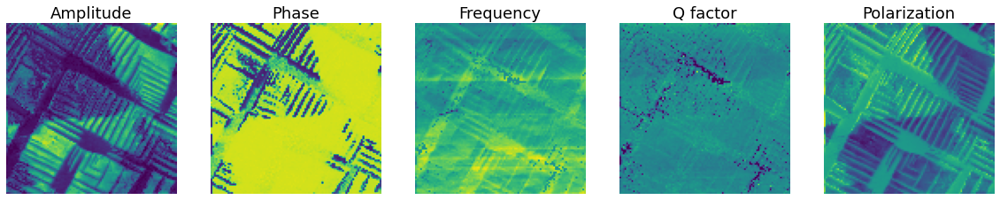

In [10]:
amp = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess']['Amplitude [V]'].reshape(100,100,384)
pha = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess']['Phase [rad]'].reshape(100,100,384)
fre = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess']['Frequency [Hz]'].reshape(100,100,384)
q = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess']['Quality Factor'].reshape(100,100,384)
#r2 = h5['Measurement_000/Channel_001/Raw_Data-SHO_Fit_000/Guess']['R2 Criterion'].reshape(100,100,384)
pola = (amp*np.cos(pha+2))*1E5

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5,figsize = (20,4))

i = 0      #select which frame you want to look
ax1.imshow(amp[:,:,i])
ax1.set_title('Amplitude', fontsize = 18)
ax1.axis('off')
ax2.imshow(pha[:,:,i])
ax2.set_title('Phase', fontsize = 18)
ax2.axis('off')
ax3.imshow(fre[:,:,i])
ax3.set_title('Frequency', fontsize = 18)
ax3.axis('off')
ax4.imshow(q[:,:,i])
ax4.set_title('Q factor', fontsize = 18)
ax4.axis('off')
ax5.imshow(pola[:,:,i])
ax5.set_title('Polarization', fontsize = 18)
ax5.axis('off')

Separate on-field and off-field response

In [11]:
#we seperate off field and on field data
rz = 100   #we cut a sub dataset with size of rz; when rz = 100, it is the full dataset
amp_on = np.zeros((192,rz,rz))
amp_off = np.zeros((192,rz,rz))
loop_on = np.zeros((rz,rz,192))
loop_off = np.zeros((rz,rz,192))

x1 = 0; y1 = 0   #where we start cutting it
for i in range (192):
  amp_on[i,:,:] = amp[x1:x1+rz,y1:y1+rz,i*2]
  amp_off[i,:,:] = amp[x1:x1+rz,y1:y1+rz,i*2+1]
  loop_on[:,:,i] = spec_loop[x1:x1+rz,y1:y1+rz,i*2]
  loop_off[:,:,i] = spec_loop[x1:x1+rz,y1:y1+rz,i*2+1]

In [12]:
# Get hysteresis loop width
def loop_width(loop):
  up = (loop[32]+loop[96]+loop[160])/3
  down = (loop[64]+loop[128])/2
  return up-down

loop = loop_off.reshape(-1,192)
lp_width = np.zeros(10000)
for i in range (10000):
  lp_width[i] = loop_width(loop[i])

In [13]:
# Get coercive field from the hysteresis loop
def coer_field(loop, voltage):
  print(loop.shape)
  co_fld_p = np.zeros((100,100))
  co_fld_n = np.zeros((100,100))
  co_fld_ave = np.zeros((100,100))
  for i in range (100):
    for j in range (100):
      co_fld_p[i,j] = (voltage[loop[:32,i,j].argmin()]+voltage[loop[64:32+64,i,j].argmin()+64]+voltage[loop[128:32+128,i,j].argmin()+128])/3
      co_fld_n[i,j] = (voltage[loop[32:64,i,j].argmin()+32] + voltage[loop[96:128,i,j].argmin()+96])/2
      co_fld_ave[i,j] = (co_fld_p[i,j]+co_fld_n[i,j])/2

  return co_fld_p, co_fld_n, co_fld_ave

#get positive coercive field, negative coercive field, and average coercive field, respectively
co_fld_p, co_fld_n, co_fld_ave = coer_field(amp_off, voltage_step)  

(192, 100, 100)


In [14]:
# Get loop area fromt the hysteresis loop
[pr_mat_ndim_real, pr_mat_ndim_imag], vdc_vec, points_measured = usid_to_pr("/content/BEPS_kyleSample_3um_0018.h5")
looparea_off = get_loop_areas(pr_mat_ndim_real, pr_mat_ndim_imag, vdc_vec, points_measured).reshape(100,100)

Prepare image patches

In [15]:
img =pola[:,:,0]
coordinates = utils.get_coord_grid(img, 1)

# extract subimage for each point on a grid
features_all, coords, frames = utils.extract_subimages(img, coordinates, 20)

indices_all = coords     #coords as indices
# features = features_all[:,:,:,0]     #image patches

Prepare data for training:

In [16]:
pix = int(np.sqrt(indices_all.shape[0]))
spec_train1 = np.zeros((pix*pix, 192))

for i in range (pix*pix):
    spec_train1[i, :] = loop_off[int(indices_all[i,1]),int(indices_all[i,0]),:]

In [17]:
cofld_train = np.zeros(pix*pix)
lpwidth = np.zeros(pix*pix)
lp_area = np.zeros(pix*pix)

for i in range (pix*pix):
    cofld_train [i] = co_fld_n[int(indices_all[i,0]), int(indices_all[i,1])]   #coercive field
    lpwidth [i] = lp_width.reshape(100,100)[int(indices_all[i,0]), int(indices_all[i,1])]    #loop width
    lp_area [i] = looparea_off[int(indices_all[i,0]), int(indices_all[i,1])]    #loop area


Prepare traing data

In [18]:
features = features_all[:,:,:,0]
n, d1, d2 = features.shape
X = features_all.reshape(n, d1*d2)  #training input: image patches

t = lpwidth     #training output; 
train_ = (t-t.min())/(t.max()-t.min())

y = train_.reshape(-1)
X.shape, y.shape

((6561, 400), (6561,))

## Train on full data

Train:

In [19]:
data_dim = X.shape[-1]

dklgp = dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=200)

Epoch 1/200 ... Training loss: 0.7761
Epoch 10/200 ... Training loss: 0.7275
Epoch 20/200 ... Training loss: 0.6879
Epoch 30/200 ... Training loss: 0.6461
Epoch 40/200 ... Training loss: 0.604
Epoch 50/200 ... Training loss: 0.562
Epoch 60/200 ... Training loss: 0.5191
Epoch 70/200 ... Training loss: 0.4738
Epoch 80/200 ... Training loss: 0.4292
Epoch 90/200 ... Training loss: 0.3838
Epoch 100/200 ... Training loss: 0.3522
Epoch 110/200 ... Training loss: 0.2976
Epoch 120/200 ... Training loss: 0.2465
Epoch 130/200 ... Training loss: 0.1972
Epoch 140/200 ... Training loss: 0.1495
Epoch 150/200 ... Training loss: 0.1008
Epoch 160/200 ... Training loss: 0.0489
Epoch 170/200 ... Training loss: -0.0022
Epoch 180/200 ... Training loss: -0.0527
Epoch 190/200 ... Training loss: -0.1038
Epoch 200/200 ... Training loss: -0.1502


Make a "prediction" on the training data (basically we look at how well it was able to "fit" the data)

/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


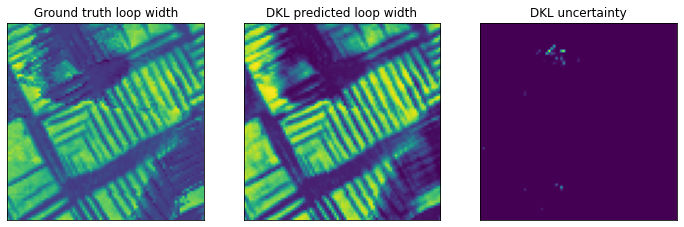

In [20]:
mean, var = dklgp.predict(X, batch_size=len(X))

_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax1.imshow(train_.reshape(pix, pix), origin = "lower")
ax1.set_title("Ground truth loop width")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(mean.reshape(pix,pix), origin = "lower")
ax2.set_title("DKL predicted loop width")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

ax3.imshow(var.reshape(pix, pix))
ax3.set_title("DKL uncertainty")
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.tick_params(axis='both', which='both', length=0)

Embeded Variables

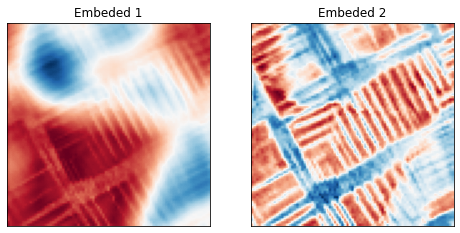

In [21]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(embeded[:,0].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax1.set_title("Embeded 1")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(embeded[:,1].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax2.set_title("Embeded 2")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

# Train on partial data

In [22]:
#training data ratio
percent = 5 

#prepare training data
idx = np.random.choice(pix*pix, int(pix*pix*percent/100), replace=False)
X_train = X[idx]
y_train = y[idx]
indices_train = []
indices_train = indices_all[idx,:]

data_dim = X_train.shape[-1]
dklgp = dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X_train, y_train, training_cycles=200)

Epoch 1/200 ... Training loss: 0.7983
Epoch 10/200 ... Training loss: 0.7618
Epoch 20/200 ... Training loss: 0.7268
Epoch 30/200 ... Training loss: 0.6901
Epoch 40/200 ... Training loss: 0.6503
Epoch 50/200 ... Training loss: 0.6081
Epoch 60/200 ... Training loss: 0.5609
Epoch 70/200 ... Training loss: 0.5055
Epoch 80/200 ... Training loss: 0.4519
Epoch 90/200 ... Training loss: 0.4008
Epoch 100/200 ... Training loss: 0.3524
Epoch 110/200 ... Training loss: 0.3034
Epoch 120/200 ... Training loss: 0.2539
Epoch 130/200 ... Training loss: 0.2043
Epoch 140/200 ... Training loss: 0.1547
Epoch 150/200 ... Training loss: 0.105
Epoch 160/200 ... Training loss: 0.0538
Epoch 170/200 ... Training loss: 0.0022
Epoch 180/200 ... Training loss: -0.0488
Epoch 190/200 ... Training loss: -0.1002
Epoch 200/200 ... Training loss: -0.1508


Make a prediction on the full data

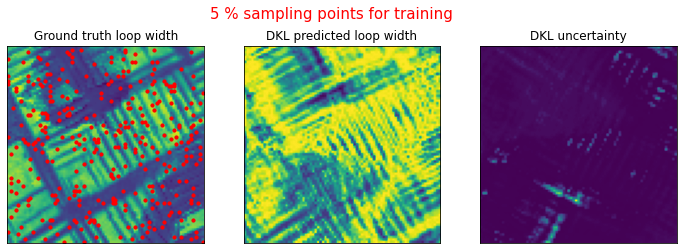

In [23]:
mean, var = dklgp.predict(X, batch_size=len(X))

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
f.suptitle("{} % sampling points for training".format(percent), fontsize = 15, color = 'red')
ax1.imshow(train_.reshape(pix, pix), origin = "lower")
ax1.scatter(indices_train[:,1]-10, indices_train[:,0]-10, s = 10, c = 'r')
ax1.set_title("Ground truth loop width")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(mean.reshape(pix,pix), origin = "lower")
ax2.set_title("DKL predicted loop width")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

ax3.imshow(var.reshape(pix, pix))
ax3.set_title("DKL uncertainty")
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.tick_params(axis='both', which='both', length=0)

Embeded variables

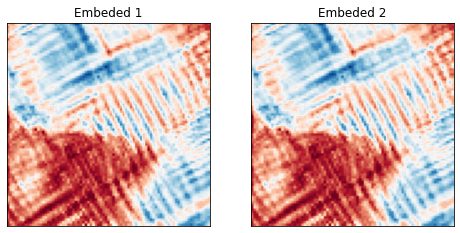

In [24]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.imshow(embeded[:,0].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax1.set_title("Embeded 1")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(embeded[:,1].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax2.set_title("Embeded 2")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

# DKL BO experiment

Prepare initial experiment data
--here our initial measurement starts from one pixel

In [25]:
# Here X_train and y_train are our measured image patches and spectra information,
# whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
  indices_train, indices_test) = train_test_split(
      X, y, indices_all, test_size=0.9998, shuffle=True, random_state=4)

Define a function to show the acquistion function image

In [26]:
def plot_result(indices, obj, j):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.scatter(indices[:, 1], indices[:, 0], s=12, marker='s', c=obj.mean(0))
    next_point = indices_test[obj.mean(0).argmax()]
    ax.scatter(next_point[1], next_point[0], marker='x', c='r')
    plt.setp(ax.get_xticklabels(), visible=False)
    plt.setp(ax.get_yticklabels(), visible=False)
    ax.tick_params(axis='both', which='both', length=0)
    ax.set_title("Step {}-Acquisition function values".format(j+1))
    plt.show()
    plt.close(fig)

set exploration steps, which is based on the training data ratio (exploration_percent)

In [27]:
exploration_percent = 0.5
exploration_steps = int(pix*pix*exploration_percent/100)
print(exploration_steps)

32


Simulated DKLBO experiment on the dummy data

1/32
Epoch 1/200 ... Training loss: 1.1994
Epoch 10/200 ... Training loss: 1.1188
Epoch 20/200 ... Training loss: 1.0286
Epoch 30/200 ... Training loss: 0.9387
Epoch 40/200 ... Training loss: 0.8507
Epoch 50/200 ... Training loss: 0.7663
Epoch 60/200 ... Training loss: 0.6872
Epoch 70/200 ... Training loss: 0.6139
Epoch 80/200 ... Training loss: 0.546
Epoch 90/200 ... Training loss: 0.4817
Epoch 100/200 ... Training loss: 0.4188
Epoch 110/200 ... Training loss: 0.3561
Epoch 120/200 ... Training loss: 0.2935
Epoch 130/200 ... Training loss: 0.2311
Epoch 140/200 ... Training loss: 0.1687
Epoch 150/200 ... Training loss: 0.1064
Epoch 160/200 ... Training loss: 0.0442
Epoch 170/200 ... Training loss: -0.018
Epoch 180/200 ... Training loss: -0.0801
Epoch 190/200 ... Training loss: -0.1421
Epoch 200/200 ... Training loss: -0.204


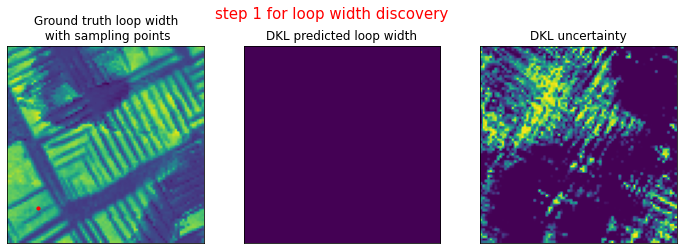

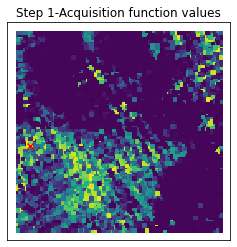

2/32
Epoch 1/200 ... Training loss: 1.1867
Epoch 10/200 ... Training loss: 1.086
Epoch 20/200 ... Training loss: 0.994
Epoch 30/200 ... Training loss: 0.9189
Epoch 40/200 ... Training loss: 0.8338
Epoch 50/200 ... Training loss: 0.7513
Epoch 60/200 ... Training loss: 0.6761
Epoch 70/200 ... Training loss: 0.6052
Epoch 80/200 ... Training loss: 0.5383
Epoch 90/200 ... Training loss: 0.475
Epoch 100/200 ... Training loss: 0.4141
Epoch 110/200 ... Training loss: 0.3539
Epoch 120/200 ... Training loss: 0.2938
Epoch 130/200 ... Training loss: 0.2339
Epoch 140/200 ... Training loss: 0.1741
Epoch 150/200 ... Training loss: 0.1144
Epoch 160/200 ... Training loss: 0.0549
Epoch 170/200 ... Training loss: -0.0044
Epoch 180/200 ... Training loss: -0.0636
Epoch 190/200 ... Training loss: -0.1226
Epoch 200/200 ... Training loss: -0.1812


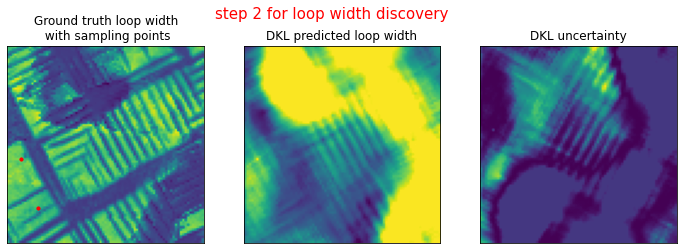

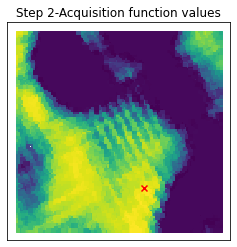

3/32
Epoch 1/200 ... Training loss: 1.1829
Epoch 10/200 ... Training loss: 1.0062
Epoch 20/200 ... Training loss: 0.9965
Epoch 30/200 ... Training loss: 0.9124
Epoch 40/200 ... Training loss: 0.8283
Epoch 50/200 ... Training loss: 0.751
Epoch 60/200 ... Training loss: 0.6765
Epoch 70/200 ... Training loss: 0.6072
Epoch 80/200 ... Training loss: 0.5427
Epoch 90/200 ... Training loss: 0.4818
Epoch 100/200 ... Training loss: 0.4213
Epoch 110/200 ... Training loss: 0.3624
Epoch 120/200 ... Training loss: 0.3035
Epoch 130/200 ... Training loss: 0.2446
Epoch 140/200 ... Training loss: 0.1858
Epoch 150/200 ... Training loss: 0.127
Epoch 160/200 ... Training loss: 0.0682
Epoch 170/200 ... Training loss: 0.0094
Epoch 180/200 ... Training loss: -0.0493
Epoch 190/200 ... Training loss: -0.1079
Epoch 200/200 ... Training loss: -0.1664


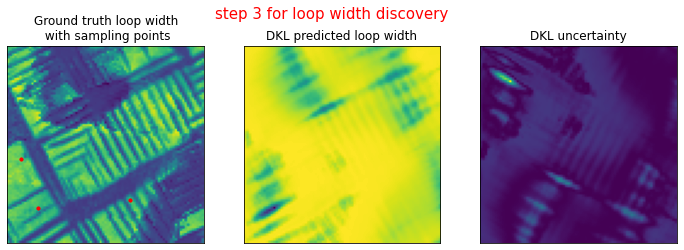

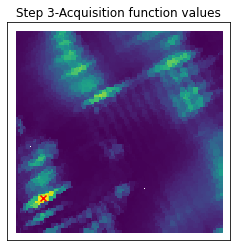

4/32
Epoch 1/200 ... Training loss: 1.1215
Epoch 10/200 ... Training loss: 0.9796
Epoch 20/200 ... Training loss: 0.9415
Epoch 30/200 ... Training loss: 0.8765
Epoch 40/200 ... Training loss: 0.796
Epoch 50/200 ... Training loss: 0.7234
Epoch 60/200 ... Training loss: 0.6568
Epoch 70/200 ... Training loss: 0.5923
Epoch 80/200 ... Training loss: 0.5321
Epoch 90/200 ... Training loss: 0.4732
Epoch 100/200 ... Training loss: 0.4155
Epoch 110/200 ... Training loss: 0.3591
Epoch 120/200 ... Training loss: 0.302
Epoch 130/200 ... Training loss: 0.2451
Epoch 140/200 ... Training loss: 0.1887
Epoch 150/200 ... Training loss: 0.1324
Epoch 160/200 ... Training loss: 0.0759
Epoch 170/200 ... Training loss: 0.0193
Epoch 180/200 ... Training loss: -0.0376
Epoch 190/200 ... Training loss: -0.0943
Epoch 200/200 ... Training loss: -0.1507


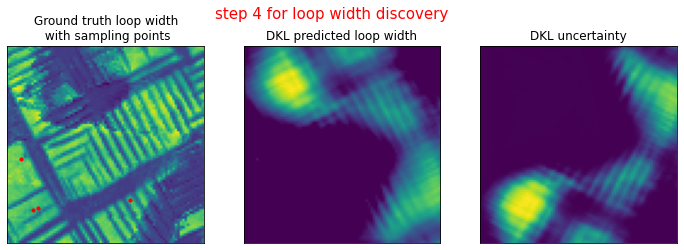

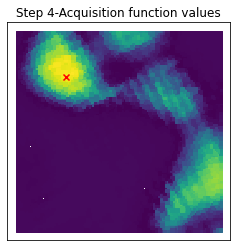

5/32
Epoch 1/200 ... Training loss: 1.0486
Epoch 10/200 ... Training loss: 0.9568
Epoch 20/200 ... Training loss: 0.8925
Epoch 30/200 ... Training loss: 0.8295
Epoch 40/200 ... Training loss: 0.7692
Epoch 50/200 ... Training loss: 0.7111
Epoch 60/200 ... Training loss: 0.6558
Epoch 70/200 ... Training loss: 0.6028
Epoch 80/200 ... Training loss: 0.5513
Epoch 90/200 ... Training loss: 0.5003
Epoch 100/200 ... Training loss: 0.4493
Epoch 110/200 ... Training loss: 0.3986
Epoch 120/200 ... Training loss: 0.3481
Epoch 130/200 ... Training loss: 0.298
Epoch 140/200 ... Training loss: 0.2483
Epoch 150/200 ... Training loss: 0.1991
Epoch 160/200 ... Training loss: 0.1505
Epoch 170/200 ... Training loss: 0.1027
Epoch 180/200 ... Training loss: 0.0559
Epoch 190/200 ... Training loss: 0.0102
Epoch 200/200 ... Training loss: -0.0344


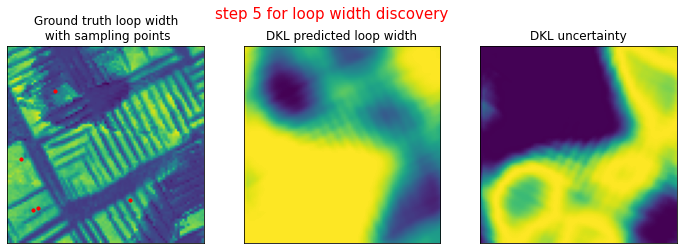

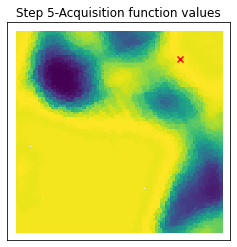

6/32
Epoch 1/200 ... Training loss: 1.0253
Epoch 10/200 ... Training loss: 0.9401
Epoch 20/200 ... Training loss: 0.8843
Epoch 30/200 ... Training loss: 0.8308
Epoch 40/200 ... Training loss: 0.776
Epoch 50/200 ... Training loss: 0.725
Epoch 60/200 ... Training loss: 0.6768
Epoch 70/200 ... Training loss: 0.6301
Epoch 80/200 ... Training loss: 0.5841
Epoch 90/200 ... Training loss: 0.5378
Epoch 100/200 ... Training loss: 0.4901
Epoch 110/200 ... Training loss: 0.4394
Epoch 120/200 ... Training loss: 0.3929
Epoch 130/200 ... Training loss: 0.3474
Epoch 140/200 ... Training loss: 0.3036
Epoch 150/200 ... Training loss: 0.2594
Epoch 160/200 ... Training loss: 0.2154
Epoch 170/200 ... Training loss: 0.1705
Epoch 180/200 ... Training loss: 0.1285
Epoch 190/200 ... Training loss: 0.0895
Epoch 200/200 ... Training loss: 0.0528


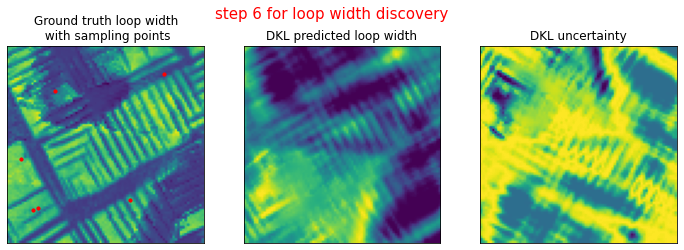

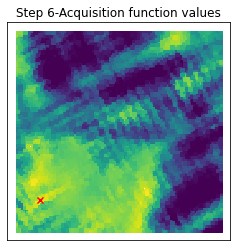

7/32
Epoch 1/200 ... Training loss: 1.0032
Epoch 10/200 ... Training loss: 0.9172
Epoch 20/200 ... Training loss: 0.8646
Epoch 30/200 ... Training loss: 0.8179
Epoch 40/200 ... Training loss: 0.7643
Epoch 50/200 ... Training loss: 0.7108
Epoch 60/200 ... Training loss: 0.663
Epoch 70/200 ... Training loss: 0.6166
Epoch 80/200 ... Training loss: 0.5707
Epoch 90/200 ... Training loss: 0.525
Epoch 100/200 ... Training loss: 0.4796
Epoch 110/200 ... Training loss: 0.4344
Epoch 120/200 ... Training loss: 0.3896
Epoch 130/200 ... Training loss: 0.3446
Epoch 140/200 ... Training loss: 0.298
Epoch 150/200 ... Training loss: 0.2486
Epoch 160/200 ... Training loss: 0.2028
Epoch 170/200 ... Training loss: 0.157
Epoch 180/200 ... Training loss: 0.1135
Epoch 190/200 ... Training loss: 0.0718
Epoch 200/200 ... Training loss: 0.0328


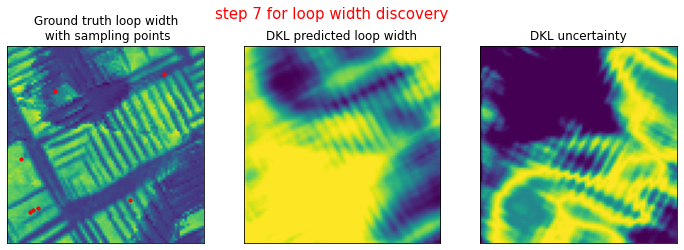

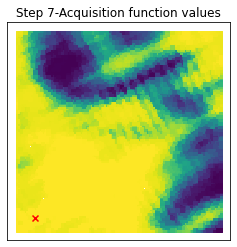

8/32
Epoch 1/200 ... Training loss: 0.9827
Epoch 10/200 ... Training loss: 0.9011
Epoch 20/200 ... Training loss: 0.8498
Epoch 30/200 ... Training loss: 0.7991
Epoch 40/200 ... Training loss: 0.7482
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.6511
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5593
Epoch 90/200 ... Training loss: 0.5138
Epoch 100/200 ... Training loss: 0.4682
Epoch 110/200 ... Training loss: 0.422
Epoch 120/200 ... Training loss: 0.3731
Epoch 130/200 ... Training loss: 0.3259
Epoch 140/200 ... Training loss: 0.2817
Epoch 150/200 ... Training loss: 0.2367
Epoch 160/200 ... Training loss: 0.1897
Epoch 170/200 ... Training loss: 0.1441
Epoch 180/200 ... Training loss: 0.1005
Epoch 190/200 ... Training loss: 0.0585
Epoch 200/200 ... Training loss: 0.0181


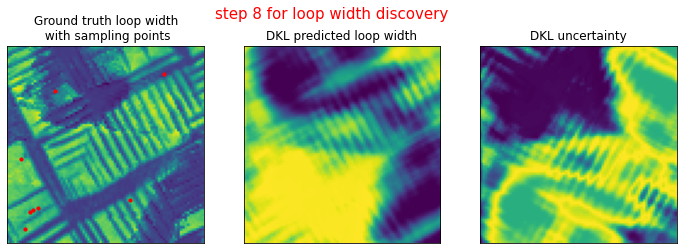

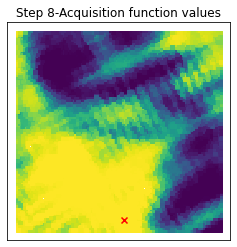

9/32
Epoch 1/200 ... Training loss: 0.9767
Epoch 10/200 ... Training loss: 0.8915
Epoch 20/200 ... Training loss: 0.8414
Epoch 30/200 ... Training loss: 0.7908
Epoch 40/200 ... Training loss: 0.7404
Epoch 50/200 ... Training loss: 0.6914
Epoch 60/200 ... Training loss: 0.6439
Epoch 70/200 ... Training loss: 0.5978
Epoch 80/200 ... Training loss: 0.5652
Epoch 90/200 ... Training loss: 0.5057
Epoch 100/200 ... Training loss: 0.4615
Epoch 110/200 ... Training loss: 0.416
Epoch 120/200 ... Training loss: 0.3705
Epoch 130/200 ... Training loss: 0.3245
Epoch 140/200 ... Training loss: 0.2766
Epoch 150/200 ... Training loss: 0.2303
Epoch 160/200 ... Training loss: 0.1858
Epoch 170/200 ... Training loss: 0.1421
Epoch 180/200 ... Training loss: 0.0984
Epoch 190/200 ... Training loss: 0.0559
Epoch 200/200 ... Training loss: 0.0148


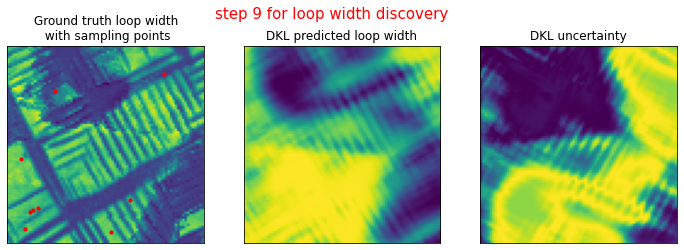

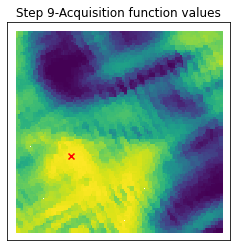

10/32
Epoch 1/200 ... Training loss: 0.9631
Epoch 10/200 ... Training loss: 0.8773
Epoch 20/200 ... Training loss: 0.8285
Epoch 30/200 ... Training loss: 0.7799
Epoch 40/200 ... Training loss: 0.7561
Epoch 50/200 ... Training loss: 0.6843
Epoch 60/200 ... Training loss: 0.6378
Epoch 70/200 ... Training loss: 0.592
Epoch 80/200 ... Training loss: 0.5468
Epoch 90/200 ... Training loss: 0.5018
Epoch 100/200 ... Training loss: 0.4568
Epoch 110/200 ... Training loss: 0.4119
Epoch 120/200 ... Training loss: 0.3671
Epoch 130/200 ... Training loss: 0.3225
Epoch 140/200 ... Training loss: 0.2777
Epoch 150/200 ... Training loss: 0.2316
Epoch 160/200 ... Training loss: 0.1837
Epoch 170/200 ... Training loss: 0.1387
Epoch 180/200 ... Training loss: 0.0944
Epoch 190/200 ... Training loss: 0.0512
Epoch 200/200 ... Training loss: 0.0081


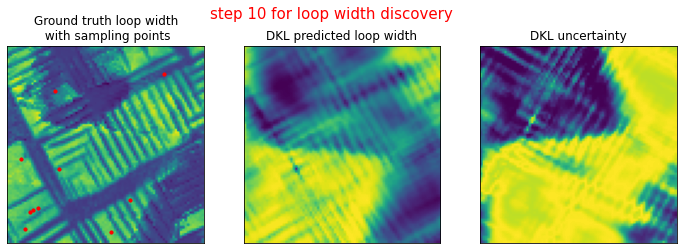

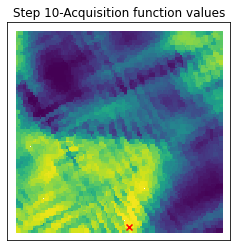

11/32
Epoch 1/200 ... Training loss: 0.9526
Epoch 10/200 ... Training loss: 0.8684
Epoch 20/200 ... Training loss: 0.8206
Epoch 30/200 ... Training loss: 0.773
Epoch 40/200 ... Training loss: 0.7256
Epoch 50/200 ... Training loss: 0.6784
Epoch 60/200 ... Training loss: 0.6326
Epoch 70/200 ... Training loss: 0.5868
Epoch 80/200 ... Training loss: 0.5418
Epoch 90/200 ... Training loss: 0.4968
Epoch 100/200 ... Training loss: 0.452
Epoch 110/200 ... Training loss: 0.4073
Epoch 120/200 ... Training loss: 0.3628
Epoch 130/200 ... Training loss: 0.3183
Epoch 140/200 ... Training loss: 0.2739
Epoch 150/200 ... Training loss: 0.2287
Epoch 160/200 ... Training loss: 0.1814
Epoch 170/200 ... Training loss: 0.1371
Epoch 180/200 ... Training loss: 0.0932
Epoch 190/200 ... Training loss: 0.0493
Epoch 200/200 ... Training loss: 0.0041


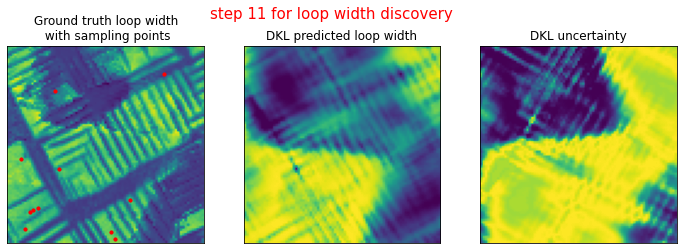

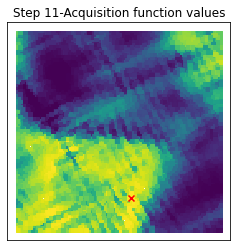

12/32
Epoch 1/200 ... Training loss: 0.9421
Epoch 10/200 ... Training loss: 0.8664
Epoch 20/200 ... Training loss: 0.8188
Epoch 30/200 ... Training loss: 0.7707
Epoch 40/200 ... Training loss: 0.7231
Epoch 50/200 ... Training loss: 0.6772
Epoch 60/200 ... Training loss: 0.6323
Epoch 70/200 ... Training loss: 0.5882
Epoch 80/200 ... Training loss: 0.5443
Epoch 90/200 ... Training loss: 0.5004
Epoch 100/200 ... Training loss: 0.4564
Epoch 110/200 ... Training loss: 0.4126
Epoch 120/200 ... Training loss: 0.3688
Epoch 130/200 ... Training loss: 0.325
Epoch 140/200 ... Training loss: 0.2798
Epoch 150/200 ... Training loss: 0.2239
Epoch 160/200 ... Training loss: 0.1775
Epoch 170/200 ... Training loss: 0.1315
Epoch 180/200 ... Training loss: 0.0871
Epoch 190/200 ... Training loss: 0.0417
Epoch 200/200 ... Training loss: -0.0025


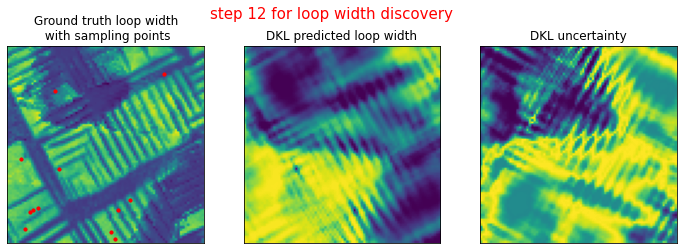

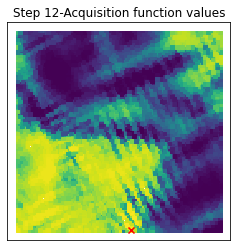

13/32
Epoch 1/200 ... Training loss: 0.9446
Epoch 10/200 ... Training loss: 0.8577
Epoch 20/200 ... Training loss: 0.8114
Epoch 30/200 ... Training loss: 0.7656
Epoch 40/200 ... Training loss: 0.7193
Epoch 50/200 ... Training loss: 0.6759
Epoch 60/200 ... Training loss: 0.6353
Epoch 70/200 ... Training loss: 0.5857
Epoch 80/200 ... Training loss: 0.5419
Epoch 90/200 ... Training loss: 0.4981
Epoch 100/200 ... Training loss: 0.4544
Epoch 110/200 ... Training loss: 0.4109
Epoch 120/200 ... Training loss: 0.3676
Epoch 130/200 ... Training loss: 0.3247
Epoch 140/200 ... Training loss: 0.2818
Epoch 150/200 ... Training loss: 0.2367
Epoch 160/200 ... Training loss: 0.1806
Epoch 170/200 ... Training loss: 0.1312
Epoch 180/200 ... Training loss: 0.0854
Epoch 190/200 ... Training loss: 0.0405
Epoch 200/200 ... Training loss: -0.0029


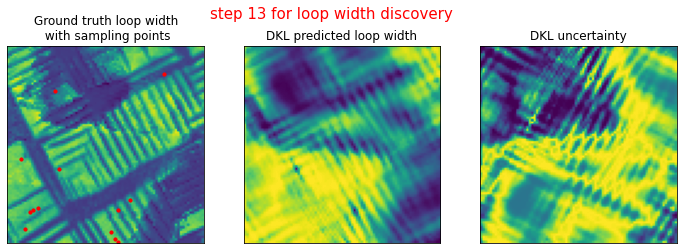

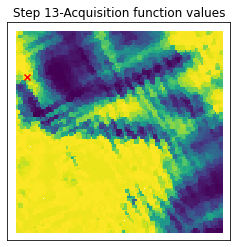

14/32
Epoch 1/200 ... Training loss: 0.947
Epoch 10/200 ... Training loss: 0.8725
Epoch 20/200 ... Training loss: 0.8173
Epoch 30/200 ... Training loss: 0.7698
Epoch 40/200 ... Training loss: 0.7222
Epoch 50/200 ... Training loss: 0.6759
Epoch 60/200 ... Training loss: 0.6324
Epoch 70/200 ... Training loss: 0.591
Epoch 80/200 ... Training loss: 0.5434
Epoch 90/200 ... Training loss: 0.5
Epoch 100/200 ... Training loss: 0.4562
Epoch 110/200 ... Training loss: 0.4111
Epoch 120/200 ... Training loss: 0.3578
Epoch 130/200 ... Training loss: 0.3097
Epoch 140/200 ... Training loss: 0.2624
Epoch 150/200 ... Training loss: 0.2166
Epoch 160/200 ... Training loss: 0.1714
Epoch 170/200 ... Training loss: 0.1271
Epoch 180/200 ... Training loss: 0.0834
Epoch 190/200 ... Training loss: 0.0407
Epoch 200/200 ... Training loss: -0.0008


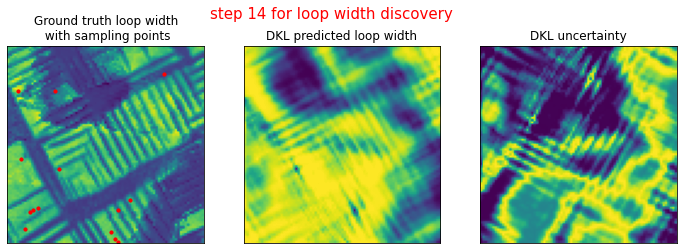

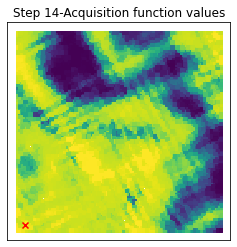

15/32
Epoch 1/200 ... Training loss: 0.9377
Epoch 10/200 ... Training loss: 0.8595
Epoch 20/200 ... Training loss: 0.815
Epoch 30/200 ... Training loss: 0.7671
Epoch 40/200 ... Training loss: 0.7179
Epoch 50/200 ... Training loss: 0.6713
Epoch 60/200 ... Training loss: 0.6265
Epoch 70/200 ... Training loss: 0.5907
Epoch 80/200 ... Training loss: 0.5398
Epoch 90/200 ... Training loss: 0.4952
Epoch 100/200 ... Training loss: 0.4523
Epoch 110/200 ... Training loss: 0.4089
Epoch 120/200 ... Training loss: 0.3658
Epoch 130/200 ... Training loss: 0.3226
Epoch 140/200 ... Training loss: 0.2782
Epoch 150/200 ... Training loss: 0.2257
Epoch 160/200 ... Training loss: 0.1749
Epoch 170/200 ... Training loss: 0.1293
Epoch 180/200 ... Training loss: 0.0843
Epoch 190/200 ... Training loss: 0.0402
Epoch 200/200 ... Training loss: -0.0029


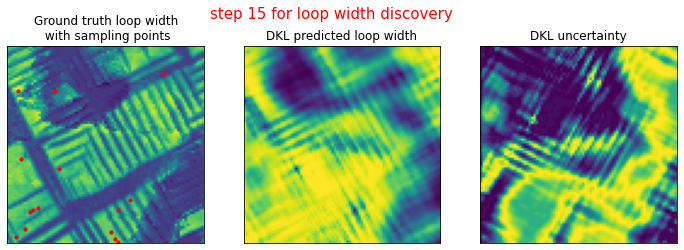

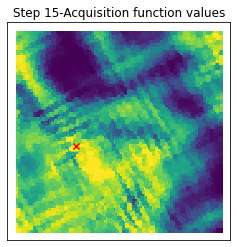

16/32
Epoch 1/200 ... Training loss: 0.9331
Epoch 10/200 ... Training loss: 0.8448
Epoch 20/200 ... Training loss: 0.8108
Epoch 30/200 ... Training loss: 0.761
Epoch 40/200 ... Training loss: 0.7131
Epoch 50/200 ... Training loss: 0.6666
Epoch 60/200 ... Training loss: 0.6217
Epoch 70/200 ... Training loss: 0.5776
Epoch 80/200 ... Training loss: 0.5339
Epoch 90/200 ... Training loss: 0.4899
Epoch 100/200 ... Training loss: 0.4441
Epoch 110/200 ... Training loss: 0.3906
Epoch 120/200 ... Training loss: 0.3439
Epoch 130/200 ... Training loss: 0.2984
Epoch 140/200 ... Training loss: 0.2515
Epoch 150/200 ... Training loss: 0.2062
Epoch 160/200 ... Training loss: 0.1614
Epoch 170/200 ... Training loss: 0.1169
Epoch 180/200 ... Training loss: 0.0735
Epoch 190/200 ... Training loss: 0.0306
Epoch 200/200 ... Training loss: -0.0119


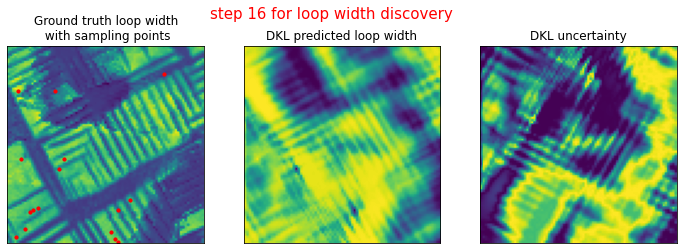

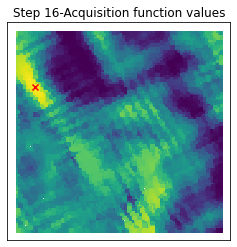

17/32
Epoch 1/200 ... Training loss: 0.9182
Epoch 10/200 ... Training loss: 0.8518
Epoch 20/200 ... Training loss: 0.8045
Epoch 30/200 ... Training loss: 0.7567
Epoch 40/200 ... Training loss: 0.7078
Epoch 50/200 ... Training loss: 0.6618
Epoch 60/200 ... Training loss: 0.6168
Epoch 70/200 ... Training loss: 0.5724
Epoch 80/200 ... Training loss: 0.5279
Epoch 90/200 ... Training loss: 0.4794
Epoch 100/200 ... Training loss: 0.4294
Epoch 110/200 ... Training loss: 0.3822
Epoch 120/200 ... Training loss: 0.3355
Epoch 130/200 ... Training loss: 0.2899
Epoch 140/200 ... Training loss: 0.2435
Epoch 150/200 ... Training loss: 0.1976
Epoch 160/200 ... Training loss: 0.1523
Epoch 170/200 ... Training loss: 0.1076
Epoch 180/200 ... Training loss: 0.0636
Epoch 190/200 ... Training loss: 0.0204
Epoch 200/200 ... Training loss: -0.0221


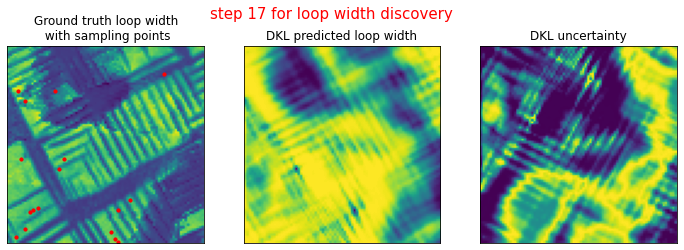

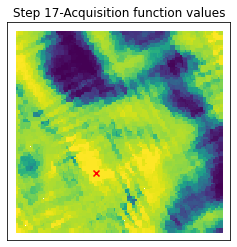

18/32
Epoch 1/200 ... Training loss: 0.9104
Epoch 10/200 ... Training loss: 0.8547
Epoch 20/200 ... Training loss: 0.8049
Epoch 30/200 ... Training loss: 0.7514
Epoch 40/200 ... Training loss: 0.7022
Epoch 50/200 ... Training loss: 0.663
Epoch 60/200 ... Training loss: 0.6175
Epoch 70/200 ... Training loss: 0.5726
Epoch 80/200 ... Training loss: 0.5284
Epoch 90/200 ... Training loss: 0.4958
Epoch 100/200 ... Training loss: 0.4406
Epoch 110/200 ... Training loss: 0.3971
Epoch 120/200 ... Training loss: 0.3538
Epoch 130/200 ... Training loss: 0.3108
Epoch 140/200 ... Training loss: 0.2681
Epoch 150/200 ... Training loss: 0.2256
Epoch 160/200 ... Training loss: 0.1829
Epoch 170/200 ... Training loss: 0.1376
Epoch 180/200 ... Training loss: 0.0831
Epoch 190/200 ... Training loss: 0.0318
Epoch 200/200 ... Training loss: -0.0124


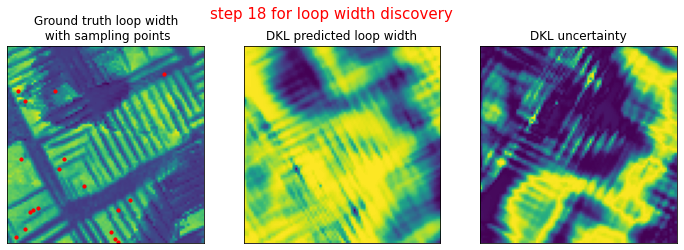

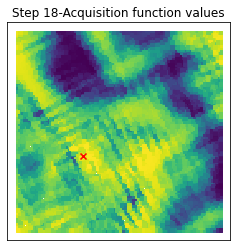

19/32
Epoch 1/200 ... Training loss: 0.904
Epoch 10/200 ... Training loss: 0.8418
Epoch 20/200 ... Training loss: 0.795
Epoch 30/200 ... Training loss: 0.7494
Epoch 40/200 ... Training loss: 0.7013
Epoch 50/200 ... Training loss: 0.6545
Epoch 60/200 ... Training loss: 0.6091
Epoch 70/200 ... Training loss: 0.5648
Epoch 80/200 ... Training loss: 0.5203
Epoch 90/200 ... Training loss: 0.4737
Epoch 100/200 ... Training loss: 0.4254
Epoch 110/200 ... Training loss: 0.3768
Epoch 120/200 ... Training loss: 0.3298
Epoch 130/200 ... Training loss: 0.2834
Epoch 140/200 ... Training loss: 0.2379
Epoch 150/200 ... Training loss: 0.192
Epoch 160/200 ... Training loss: 0.1465
Epoch 170/200 ... Training loss: 0.1014
Epoch 180/200 ... Training loss: 0.0569
Epoch 190/200 ... Training loss: 0.013
Epoch 200/200 ... Training loss: -0.0302


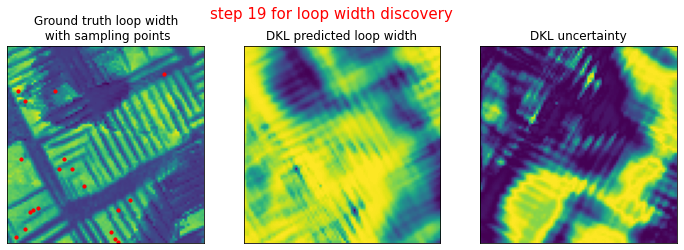

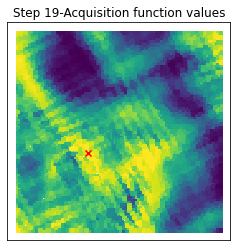

20/32
Epoch 1/200 ... Training loss: 0.8986
Epoch 10/200 ... Training loss: 0.8396
Epoch 20/200 ... Training loss: 0.7948
Epoch 30/200 ... Training loss: 0.7461
Epoch 40/200 ... Training loss: 0.6976
Epoch 50/200 ... Training loss: 0.6499
Epoch 60/200 ... Training loss: 0.6071
Epoch 70/200 ... Training loss: 0.5566
Epoch 80/200 ... Training loss: 0.5193
Epoch 90/200 ... Training loss: 0.4703
Epoch 100/200 ... Training loss: 0.4188
Epoch 110/200 ... Training loss: 0.3719
Epoch 120/200 ... Training loss: 0.3256
Epoch 130/200 ... Training loss: 0.2792
Epoch 140/200 ... Training loss: 0.2332
Epoch 150/200 ... Training loss: 0.1874
Epoch 160/200 ... Training loss: 0.1419
Epoch 170/200 ... Training loss: 0.0969
Epoch 180/200 ... Training loss: 0.0519
Epoch 190/200 ... Training loss: 0.0078
Epoch 200/200 ... Training loss: -0.0357


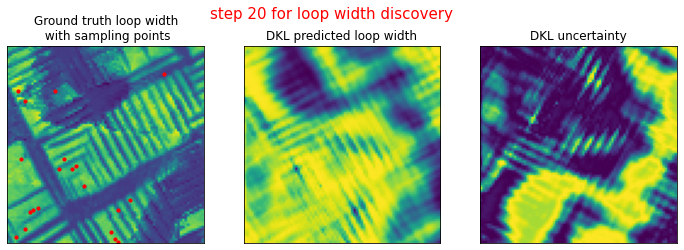

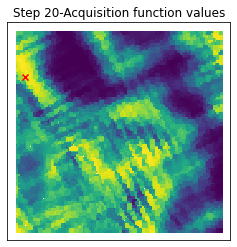

21/32
Epoch 1/200 ... Training loss: 0.895
Epoch 10/200 ... Training loss: 0.8443
Epoch 20/200 ... Training loss: 0.7935
Epoch 30/200 ... Training loss: 0.7356
Epoch 40/200 ... Training loss: 0.7042
Epoch 50/200 ... Training loss: 0.6563
Epoch 60/200 ... Training loss: 0.6106
Epoch 70/200 ... Training loss: 0.565
Epoch 80/200 ... Training loss: 0.5201
Epoch 90/200 ... Training loss: 0.4756
Epoch 100/200 ... Training loss: 0.4314
Epoch 110/200 ... Training loss: 0.3874
Epoch 120/200 ... Training loss: 0.3437
Epoch 130/200 ... Training loss: 0.3002
Epoch 140/200 ... Training loss: 0.2567
Epoch 150/200 ... Training loss: 0.2127
Epoch 160/200 ... Training loss: 0.1665
Epoch 170/200 ... Training loss: 0.1191
Epoch 180/200 ... Training loss: 0.067
Epoch 190/200 ... Training loss: 0.0183
Epoch 200/200 ... Training loss: -0.0266


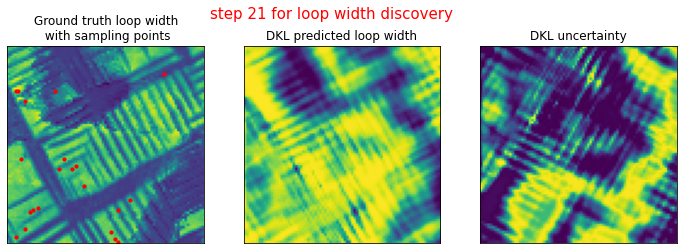

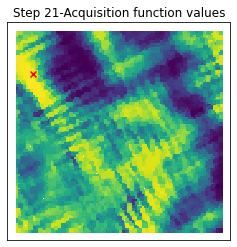

22/32
Epoch 1/200 ... Training loss: 0.8934
Epoch 10/200 ... Training loss: 0.839
Epoch 20/200 ... Training loss: 0.7929
Epoch 30/200 ... Training loss: 0.7426
Epoch 40/200 ... Training loss: 0.6931
Epoch 50/200 ... Training loss: 0.6499
Epoch 60/200 ... Training loss: 0.602
Epoch 70/200 ... Training loss: 0.558
Epoch 80/200 ... Training loss: 0.5148
Epoch 90/200 ... Training loss: 0.4706
Epoch 100/200 ... Training loss: 0.4257
Epoch 110/200 ... Training loss: 0.3779
Epoch 120/200 ... Training loss: 0.3276
Epoch 130/200 ... Training loss: 0.2798
Epoch 140/200 ... Training loss: 0.2333
Epoch 150/200 ... Training loss: 0.1879
Epoch 160/200 ... Training loss: 0.1411
Epoch 170/200 ... Training loss: 0.0956
Epoch 180/200 ... Training loss: 0.0505
Epoch 190/200 ... Training loss: 0.0057
Epoch 200/200 ... Training loss: -0.0386


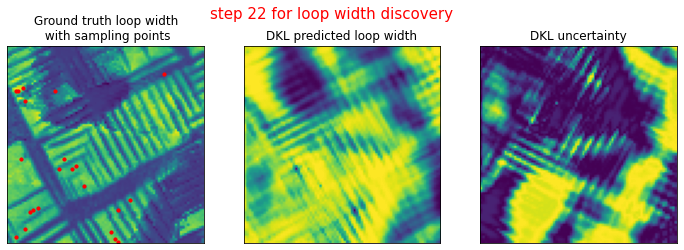

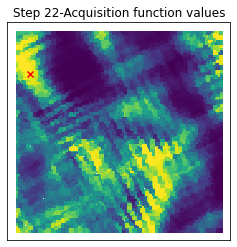

23/32
Epoch 1/200 ... Training loss: 0.8921
Epoch 10/200 ... Training loss: 0.8438
Epoch 20/200 ... Training loss: 0.7936
Epoch 30/200 ... Training loss: 0.7465
Epoch 40/200 ... Training loss: 0.6989
Epoch 50/200 ... Training loss: 0.6517
Epoch 60/200 ... Training loss: 0.6057
Epoch 70/200 ... Training loss: 0.5611
Epoch 80/200 ... Training loss: 0.5173
Epoch 90/200 ... Training loss: 0.4737
Epoch 100/200 ... Training loss: 0.4302
Epoch 110/200 ... Training loss: 0.3865
Epoch 120/200 ... Training loss: 0.3425
Epoch 130/200 ... Training loss: 0.2978
Epoch 140/200 ... Training loss: 0.2478
Epoch 150/200 ... Training loss: 0.1941
Epoch 160/200 ... Training loss: 0.1486
Epoch 170/200 ... Training loss: 0.1029
Epoch 180/200 ... Training loss: 0.0579
Epoch 190/200 ... Training loss: 0.0129
Epoch 200/200 ... Training loss: -0.0314


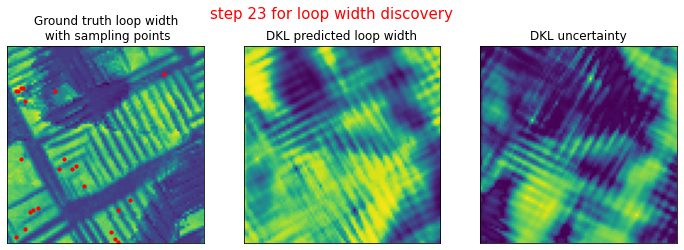

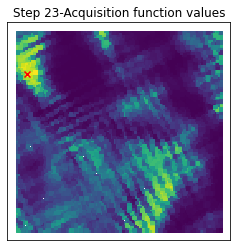

24/32
Epoch 1/200 ... Training loss: 0.8892
Epoch 10/200 ... Training loss: 0.8335
Epoch 20/200 ... Training loss: 0.7892
Epoch 30/200 ... Training loss: 0.7429
Epoch 40/200 ... Training loss: 0.6943
Epoch 50/200 ... Training loss: 0.6482
Epoch 60/200 ... Training loss: 0.6042
Epoch 70/200 ... Training loss: 0.5602
Epoch 80/200 ... Training loss: 0.5169
Epoch 90/200 ... Training loss: 0.4737
Epoch 100/200 ... Training loss: 0.4301
Epoch 110/200 ... Training loss: 0.3854
Epoch 120/200 ... Training loss: 0.3357
Epoch 130/200 ... Training loss: 0.284
Epoch 140/200 ... Training loss: 0.2397
Epoch 150/200 ... Training loss: 0.1933
Epoch 160/200 ... Training loss: 0.1482
Epoch 170/200 ... Training loss: 0.1034
Epoch 180/200 ... Training loss: 0.0592
Epoch 190/200 ... Training loss: 0.0149
Epoch 200/200 ... Training loss: -0.0292


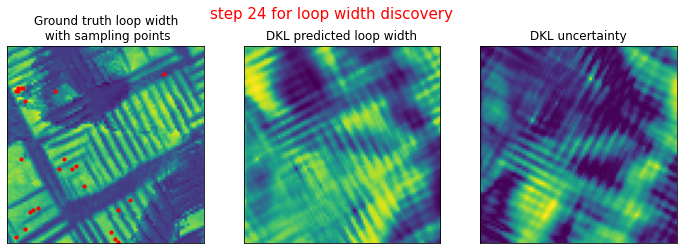

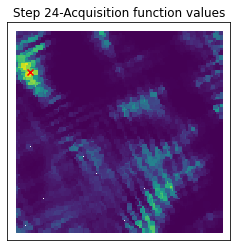

25/32
Epoch 1/200 ... Training loss: 0.8855
Epoch 10/200 ... Training loss: 0.831
Epoch 20/200 ... Training loss: 0.7862
Epoch 30/200 ... Training loss: 0.7407
Epoch 40/200 ... Training loss: 0.6942
Epoch 50/200 ... Training loss: 0.6466
Epoch 60/200 ... Training loss: 0.6059
Epoch 70/200 ... Training loss: 0.5605
Epoch 80/200 ... Training loss: 0.5179
Epoch 90/200 ... Training loss: 0.4746
Epoch 100/200 ... Training loss: 0.4314
Epoch 110/200 ... Training loss: 0.3878
Epoch 120/200 ... Training loss: 0.341
Epoch 130/200 ... Training loss: 0.2877
Epoch 140/200 ... Training loss: 0.24
Epoch 150/200 ... Training loss: 0.1936
Epoch 160/200 ... Training loss: 0.1484
Epoch 170/200 ... Training loss: 0.1035
Epoch 180/200 ... Training loss: 0.059
Epoch 190/200 ... Training loss: 0.0146
Epoch 200/200 ... Training loss: -0.0295


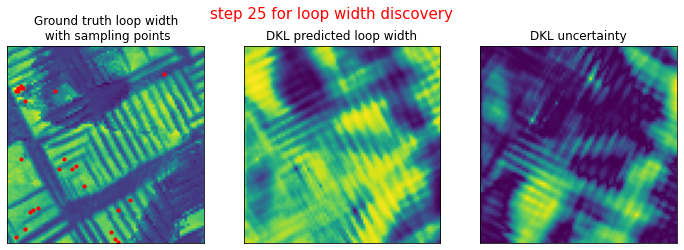

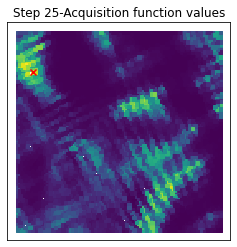

26/32
Epoch 1/200 ... Training loss: 0.8818
Epoch 10/200 ... Training loss: 0.8327
Epoch 20/200 ... Training loss: 0.7875
Epoch 30/200 ... Training loss: 0.7382
Epoch 40/200 ... Training loss: 0.6888
Epoch 50/200 ... Training loss: 0.6569
Epoch 60/200 ... Training loss: 0.604
Epoch 70/200 ... Training loss: 0.5587
Epoch 80/200 ... Training loss: 0.515
Epoch 90/200 ... Training loss: 0.4773
Epoch 100/200 ... Training loss: 0.4274
Epoch 110/200 ... Training loss: 0.3797
Epoch 120/200 ... Training loss: 0.3286
Epoch 130/200 ... Training loss: 0.2814
Epoch 140/200 ... Training loss: 0.2351
Epoch 150/200 ... Training loss: 0.1906
Epoch 160/200 ... Training loss: 0.1461
Epoch 170/200 ... Training loss: 0.1006
Epoch 180/200 ... Training loss: 0.0555
Epoch 190/200 ... Training loss: 0.0109
Epoch 200/200 ... Training loss: -0.0346


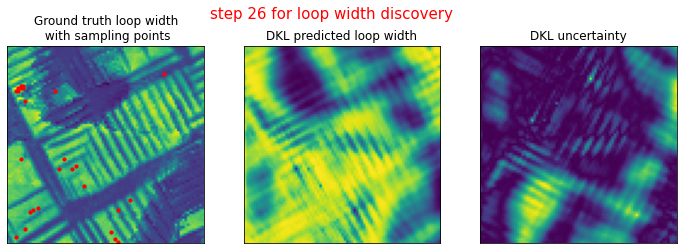

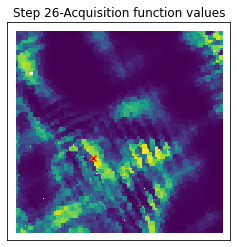

27/32
Epoch 1/200 ... Training loss: 0.8787
Epoch 10/200 ... Training loss: 0.8277
Epoch 20/200 ... Training loss: 0.7811
Epoch 30/200 ... Training loss: 0.7363
Epoch 40/200 ... Training loss: 0.6907
Epoch 50/200 ... Training loss: 0.6449
Epoch 60/200 ... Training loss: 0.5995
Epoch 70/200 ... Training loss: 0.555
Epoch 80/200 ... Training loss: 0.5112
Epoch 90/200 ... Training loss: 0.4668
Epoch 100/200 ... Training loss: 0.42
Epoch 110/200 ... Training loss: 0.3674
Epoch 120/200 ... Training loss: 0.3208
Epoch 130/200 ... Training loss: 0.2751
Epoch 140/200 ... Training loss: 0.2303
Epoch 150/200 ... Training loss: 0.1853
Epoch 160/200 ... Training loss: 0.1408
Epoch 170/200 ... Training loss: 0.0958
Epoch 180/200 ... Training loss: 0.0497
Epoch 190/200 ... Training loss: 0.0046
Epoch 200/200 ... Training loss: -0.04


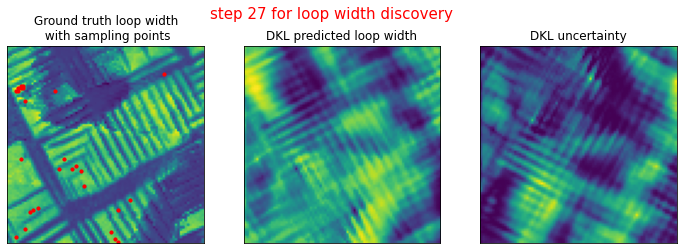

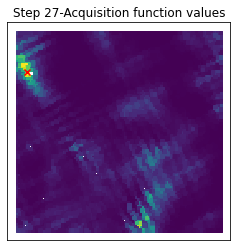

28/32
Epoch 1/200 ... Training loss: 0.8751
Epoch 10/200 ... Training loss: 0.8253
Epoch 20/200 ... Training loss: 0.7804
Epoch 30/200 ... Training loss: 0.7332
Epoch 40/200 ... Training loss: 0.6863
Epoch 50/200 ... Training loss: 0.6389
Epoch 60/200 ... Training loss: 0.5984
Epoch 70/200 ... Training loss: 0.5543
Epoch 80/200 ... Training loss: 0.5109
Epoch 90/200 ... Training loss: 0.4674
Epoch 100/200 ... Training loss: 0.4231
Epoch 110/200 ... Training loss: 0.3768
Epoch 120/200 ... Training loss: 0.3233
Epoch 130/200 ... Training loss: 0.276
Epoch 140/200 ... Training loss: 0.2302
Epoch 150/200 ... Training loss: 0.1843
Epoch 160/200 ... Training loss: 0.1387
Epoch 170/200 ... Training loss: 0.0933
Epoch 180/200 ... Training loss: 0.048
Epoch 190/200 ... Training loss: 0.003
Epoch 200/200 ... Training loss: -0.0419


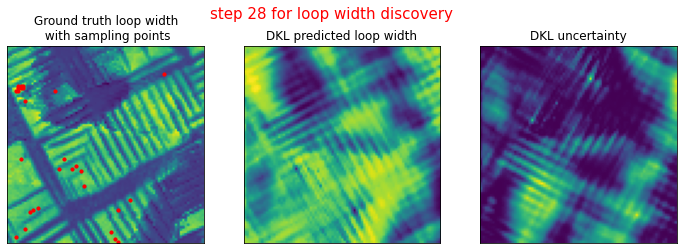

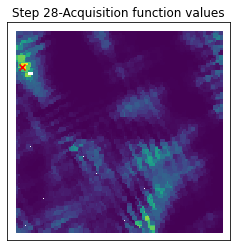

29/32
Epoch 1/200 ... Training loss: 0.8724
Epoch 10/200 ... Training loss: 0.8298
Epoch 20/200 ... Training loss: 0.783
Epoch 30/200 ... Training loss: 0.7352
Epoch 40/200 ... Training loss: 0.6875
Epoch 50/200 ... Training loss: 0.6398
Epoch 60/200 ... Training loss: 0.5968
Epoch 70/200 ... Training loss: 0.551
Epoch 80/200 ... Training loss: 0.5159
Epoch 90/200 ... Training loss: 0.4732
Epoch 100/200 ... Training loss: 0.4293
Epoch 110/200 ... Training loss: 0.3856
Epoch 120/200 ... Training loss: 0.3415
Epoch 130/200 ... Training loss: 0.297
Epoch 140/200 ... Training loss: 0.2486
Epoch 150/200 ... Training loss: 0.2016
Epoch 160/200 ... Training loss: 0.1556
Epoch 170/200 ... Training loss: 0.1094
Epoch 180/200 ... Training loss: 0.0622
Epoch 190/200 ... Training loss: 0.0135
Epoch 200/200 ... Training loss: -0.0321


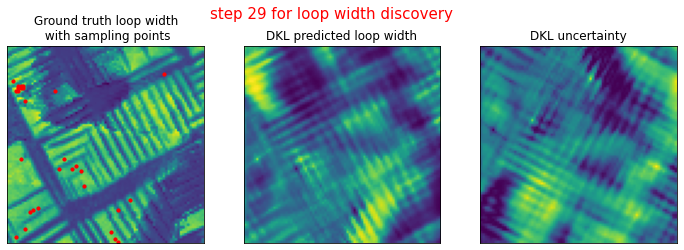

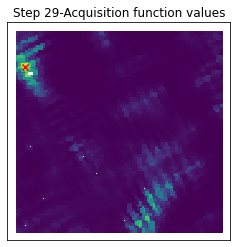

30/32
Epoch 1/200 ... Training loss: 0.8691
Epoch 10/200 ... Training loss: 0.8385
Epoch 20/200 ... Training loss: 0.779
Epoch 30/200 ... Training loss: 0.7337
Epoch 40/200 ... Training loss: 0.6887
Epoch 50/200 ... Training loss: 0.6431
Epoch 60/200 ... Training loss: 0.5982
Epoch 70/200 ... Training loss: 0.5539
Epoch 80/200 ... Training loss: 0.5101
Epoch 90/200 ... Training loss: 0.4654
Epoch 100/200 ... Training loss: 0.4204
Epoch 110/200 ... Training loss: 0.3702
Epoch 120/200 ... Training loss: 0.3204
Epoch 130/200 ... Training loss: 0.2733
Epoch 140/200 ... Training loss: 0.2273
Epoch 150/200 ... Training loss: 0.1818
Epoch 160/200 ... Training loss: 0.1368
Epoch 170/200 ... Training loss: 0.0922
Epoch 180/200 ... Training loss: 0.0455
Epoch 190/200 ... Training loss: 0.0006
Epoch 200/200 ... Training loss: -0.0455


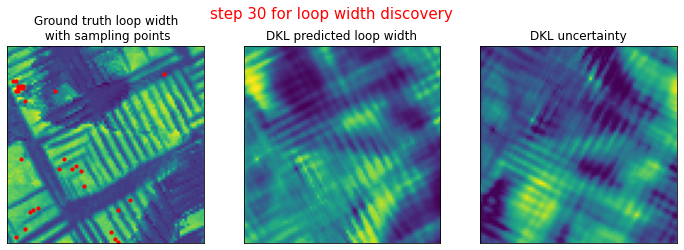

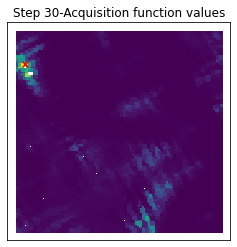

31/32
Epoch 1/200 ... Training loss: 0.8663
Epoch 10/200 ... Training loss: 0.8158
Epoch 20/200 ... Training loss: 0.7723
Epoch 30/200 ... Training loss: 0.7285
Epoch 40/200 ... Training loss: 0.6848
Epoch 50/200 ... Training loss: 0.64
Epoch 60/200 ... Training loss: 0.5928
Epoch 70/200 ... Training loss: 0.5522
Epoch 80/200 ... Training loss: 0.5093
Epoch 90/200 ... Training loss: 0.4661
Epoch 100/200 ... Training loss: 0.4221
Epoch 110/200 ... Training loss: 0.3771
Epoch 120/200 ... Training loss: 0.3269
Epoch 130/200 ... Training loss: 0.2757
Epoch 140/200 ... Training loss: 0.2299
Epoch 150/200 ... Training loss: 0.184
Epoch 160/200 ... Training loss: 0.139
Epoch 170/200 ... Training loss: 0.0926
Epoch 180/200 ... Training loss: 0.046
Epoch 190/200 ... Training loss: 0.0
Epoch 200/200 ... Training loss: -0.0458


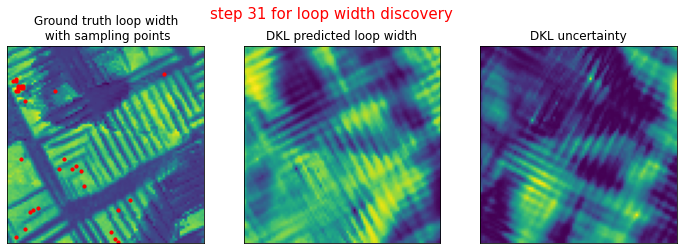

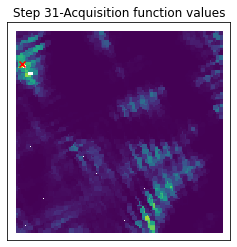

32/32
Epoch 1/200 ... Training loss: 0.8632
Epoch 10/200 ... Training loss: 0.8127
Epoch 20/200 ... Training loss: 0.7692
Epoch 30/200 ... Training loss: 0.7251
Epoch 40/200 ... Training loss: 0.6805
Epoch 50/200 ... Training loss: 0.6358
Epoch 60/200 ... Training loss: 0.5918
Epoch 70/200 ... Training loss: 0.5483
Epoch 80/200 ... Training loss: 0.5053
Epoch 90/200 ... Training loss: 0.461
Epoch 100/200 ... Training loss: 0.4123
Epoch 110/200 ... Training loss: 0.3636
Epoch 120/200 ... Training loss: 0.3167
Epoch 130/200 ... Training loss: 0.2707
Epoch 140/200 ... Training loss: 0.2251
Epoch 150/200 ... Training loss: 0.1795
Epoch 160/200 ... Training loss: 0.134
Epoch 170/200 ... Training loss: 0.0886
Epoch 180/200 ... Training loss: 0.0429
Epoch 190/200 ... Training loss: -0.0027
Epoch 200/200 ... Training loss: -0.0486


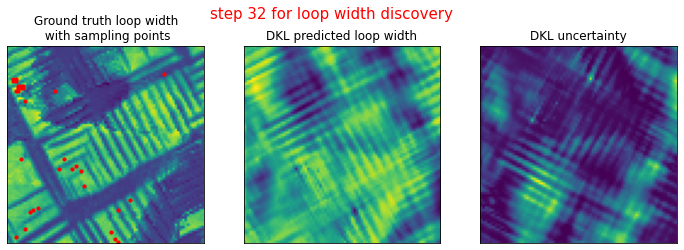

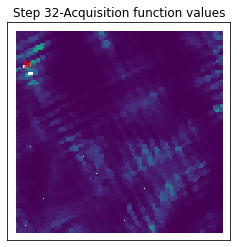

In [28]:
data_dim = X_train.shape[-1]

xi = 0.01  # balances exploration and explitation for EI and qEI

for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200)
    
    mean, var = dklgp.predict(X, batch_size=len(X))

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
    f.suptitle("step {} for loop width discovery".format(e+1), fontsize = 15, color = 'red')
    ax1.imshow(train_.reshape(pix, pix), origin = "lower")
    ax1.scatter(indices_train[:,1]-10, indices_train[:,0]-10, s = 10, c = 'r')
    ax1.set_title("Ground truth loop width\n with sampling points")
    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax1.get_yticklabels(), visible=False)
    ax1.tick_params(axis='both', which='both', length=0)

    ax2.imshow(mean.reshape(pix,pix), origin = "lower")
    ax2.set_title("DKL predicted loop width")
    plt.setp(ax2.get_xticklabels(), visible=False)
    plt.setp(ax2.get_yticklabels(), visible=False)
    ax2.tick_params(axis='both', which='both', length=0)

    ax3.imshow(var.reshape(pix, pix))
    ax3.set_title("DKL uncertainty")
    plt.setp(ax3.get_xticklabels(), visible=False)
    plt.setp(ax3.get_yticklabels(), visible=False)
    ax3.tick_params(axis='both', which='both', length=0)

    plt.show()
    plt.close(f)
    # Compute acquisition function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    # Select next point to "measure"
    next_point_idx = obj.mean(0).argmax()
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result
    plot_result(indices_test, obj, e)
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point)
    y_test = np.delete(y_test, next_point_idx)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)


Plot exploration path

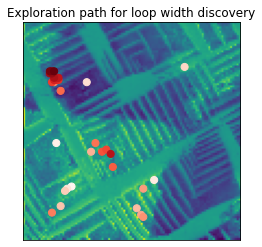

In [29]:
import matplotlib
colors = matplotlib.cm.Reds(np.linspace(0, 1, exploration_steps+1))
f, ax = plt.subplots(figsize = (4,4))
plt.imshow(img, origin = 'lower')
plt.scatter(indices_train[:,1], indices_train[:,0], color = colors, s = 50)
plt.title("Exploration path for loop width discovery")
# plt.scatter(10,10, s = 100, c = 'r')
plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)
plt.tick_params(axis='both', which='both', length=0)

DKL prediction based on exploration

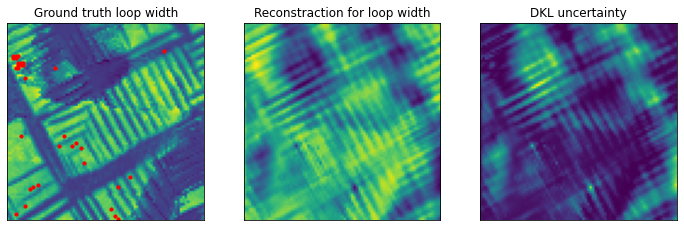

In [30]:
mean, var = dklgp.predict(X, batch_size=len(X))

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax1.imshow(train_.reshape(pix, pix), origin = "lower")
ax1.scatter(indices_train[:,1]-10, indices_train[:,0]-10, s = 10, c = 'r')
ax1.set_title("Ground truth loop width")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(mean.reshape(pix,pix), origin = "lower")
ax2.set_title("Reconstraction for loop width")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

ax3.imshow(var.reshape(pix, pix), origin = "lower")
ax3.set_title("DKL uncertainty")
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.tick_params(axis='both', which='both', length=0)